# DALL·E Mini

This is an simple way of creating [DALL·E Mini](https://github.com/borisdayma/dalle-mini) artworks for generative artists.

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.


Check your jaxlib version and install the appropriate version. for example,

pip install "jax[cuda11_cudnn82]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
```

```{toggle}
%%capture
!pip install ekorpkit[art]
exit()
```

## Prepare Environment

In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime
%load_ext autoreload
%autoreload 2 # reload modules before executing user code, set to 0 to disable

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device="4,5")
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
eKonf.set_workspace(workspace="/content/drive/MyDrive/workspace/", project="ekorpkit-book")

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:4)', 'A100-SXM4-40GB (id:5)']
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace/
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev3
is notebook? True
is colab? False


('/content/drive/MyDrive/workspace', 'ekorpkit-book')

time: 3.35 s (started: 2022-11-02 11:20:43 +00:00)


## Create a dalle-mini instance

In [2]:
from ekorpkit.models.art.mini import DalleMini

# cfg = eKonf.compose("model/dalle_mini")
# dalle = eKonf.instantiate(cfg)
dalle = DalleMini()

wandb: Downloading large artifact mega-1-fp16:latest, 4938.53MB. 7 files... Done. 0:0:14.4
Some of the weights of DalleBart were initialized in float16 precision from the model checkpoint at /tmp/tmp5vurqdlq:
[('lm_head', 'kernel'), ('model', 'decoder', 'embed_positions', 'embedding'), ('model', 'decoder', 'embed_tokens', 'embedding'), ('model', 'decoder', 'final_ln', 'bias'), ('model', 'decoder', 'layernorm_embedding', 'bias'), ('model', 'decoder', 'layernorm_embedding', 'scale'), ('model', 'decoder', 'layers', 'FlaxBartDecoderLayers', 'FlaxBartAttention_0', 'k_proj', 'kernel'), ('model', 'decoder', 'layers', 'FlaxBartDecoderLayers', 'FlaxBartAttention_0', 'out_proj', 'kernel'), ('model', 'decoder', 'layers', 'FlaxBartDecoderLayers', 'FlaxBartAttention_0', 'q_proj', 'kernel'), ('model', 'decoder', 'layers', 'FlaxBartDecoderLayers', 'FlaxBartAttention_0', 'v_proj', 'kernel'), ('model', 'decoder', 'layers', 'FlaxBartDecoderLayers', 'FlaxBartAttention_1', 'k_proj', 'kernel'), ('model', '

time: 54.5 s (started: 2022-11-02 11:20:46 +00:00)


## Generate an image

In [3]:
text_prompts = "a living tiger inside a gorgeous cave in a futuristic Jeju island, relaxing night, watercolour on the ceiling, glowing on glass, light art, dark, dark, gorgeous, dark, bright in an abandoned village in a futuristic alien nightscape"
batch_name = "cave-jeju"

time: 784 µs (started: 2022-11-02 11:21:41 +00:00)


8 samples generated to /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch
text prompts: ['a living tiger inside a gorgeous cave in a futuristic Jeju island, relaxing night, watercolour on the ceiling, glowing on glass, light art, dark, dark, gorgeous, dark, bright in an abandoned village in a futuristic alien nightscape']


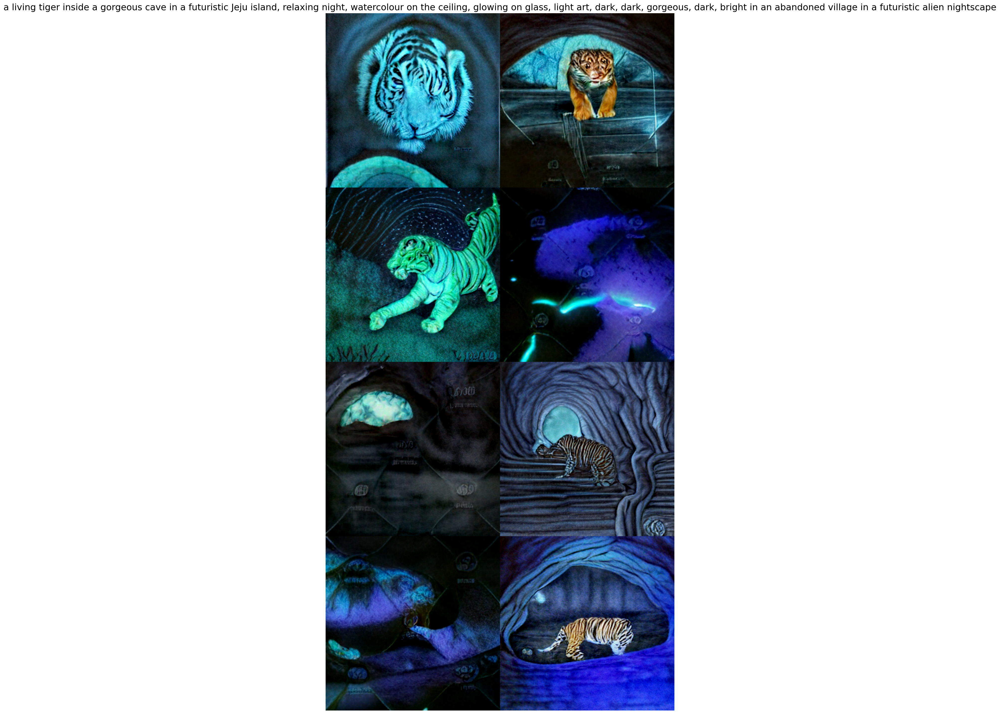

time: 1min 24s (started: 2022-11-02 11:06:11 +00:00)


In [4]:
results = dalle.imagine(
    text_prompts, 
    batch_name=batch_name, 
    num_samples=8, 
    show_collage=False,
)

In [6]:
results

{'image_filepaths': ['/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0000.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0001.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0002.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0003.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0004.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0005.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_0006.png',
  '/content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-bat

time: 3.92 ms (started: 2022-11-02 11:07:44 +00:00)


## Collage generated sample images

INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Batch name: cave-jeju, Batch num: 0
INFO:ekorpkit.batch:Loading config from /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_config.yaml
INFO:ekorpkit.batch:Merging config with the loaded config
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Setting seed to 3510911960
INFO:ekorpkit.models.art.base:Prompt: a living tiger inside a gorgeous cave in a futuristic Jeju island, relaxing night, watercolour on the ceiling, glowing on glass, light art, dark, dark, gorgeous, dark, bright in an abandoned village in a futuristic alien nightscape
INFO:ekorpkit.io.file:Processing [8] files from ['cave-jeju(0)_*.png']


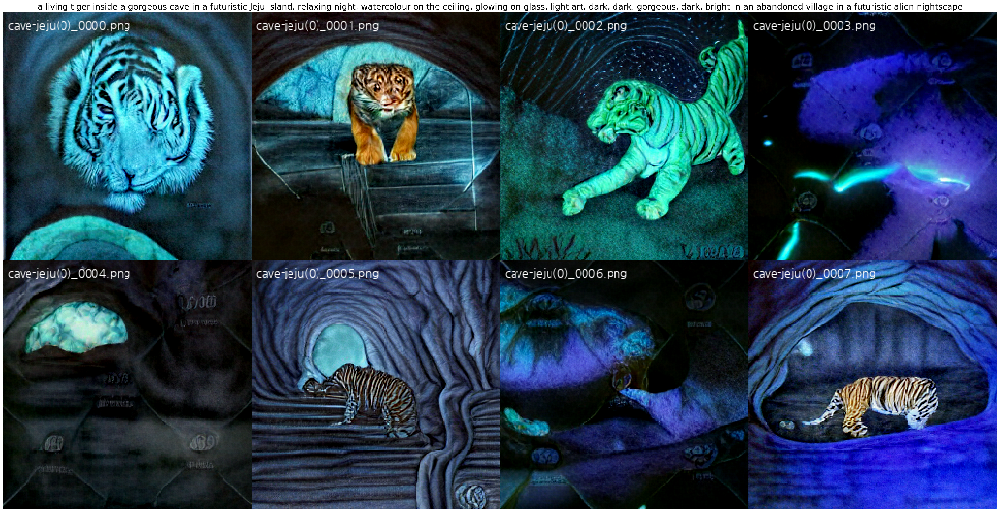

time: 1.88 s (started: 2022-11-02 11:22:59 +00:00)


In [9]:
dalle.collage(
    batch_name=batch_name,
    batch_num=0,
    ncols=4,
    num_images=8,
    show_filename=True,
    fontcolor="white",
)

##  Configuration

In [11]:
dalle.verbose = True
eKonf.setLogger("INFO")

config = dalle.load_config(batch_name=batch_name, batch_num=0)
eKonf.print(config)

INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Batch name: cave-jeju, Batch num: 0
INFO:ekorpkit.batch:Loading config from /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_config.yaml
INFO:ekorpkit.batch:Merging config with the loaded config
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Setting seed to 2461285802


{'_target_': 'ekorpkit.models.art.mini.DalleMini',
 'autoload': True,
 'batch_name': 'cave-jeju',
 'batch_num': 0,
 'device': '4, 5',
 'imagine': {'cond_scale': 10.0,
             'gen_top_k': None,
             'gen_top_p': None,
             'num_samples': 8,
             'temperature': None,
             'text_prompts': ['a living tiger inside a gorgeous cave in a '
                              'futuristic Jeju island, relaxing night, '
                              'watercolour on the ceiling, glowing on glass, '
                              'light art, dark, dark, gorgeous, dark, bright '
                              'in an abandoned village in a futuristic alien '
                              'nightscape']},
 'model': {'CLIP_COMMIT_ID': None,
           'CLIP_INIT': False,
           'CLIP_REPO': 'openai/clip-vit-base-patch32',
           'DALLE_COMMIT_ID': None,
           'DALLE_INIT': False,
           'DALLE_MODEL': 'dalle-mini/dalle-mini/mega-1-fp16:latest',
           '

In [8]:
dalle.save_config()

INFO:ekorpkit.batch:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_config.yaml


'cave-jeju(0)_config.yaml'

time: 30.3 ms (started: 2022-11-02 11:22:53 +00:00)


In [12]:
dalle.show_config(batch_name=batch_name, batch_num=0)

INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Batch name: cave-jeju, Batch num: 0
INFO:ekorpkit.batch:Loading config from /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/dalle-mini/mini-batch/cave-jeju(0)_config.yaml
INFO:ekorpkit.batch:Merging config with the loaded config
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Setting seed to 4269935367


{'_target_': 'ekorpkit.models.art.mini.DalleMini',
 'autoload': True,
 'batch_name': 'cave-jeju',
 'batch_num': 0,
 'device': '4, 5',
 'imagine': {'cond_scale': 10.0,
             'gen_top_k': None,
             'gen_top_p': None,
             'num_samples': 8,
             'temperature': None,
             'text_prompts': ['a living tiger inside a gorgeous cave in a '
                              'futuristic Jeju island, relaxing night, '
                              'watercolour on the ceiling, glowing on glass, '
                              'light art, dark, dark, gorgeous, dark, bright '
                              'in an abandoned village in a futuristic alien '
                              'nightscape']},
 'model': {'CLIP_COMMIT_ID': None,
           'CLIP_INIT': False,
           'CLIP_REPO': 'openai/clip-vit-base-patch32',
           'DALLE_COMMIT_ID': None,
           'DALLE_INIT': False,
           'DALLE_MODEL': 'dalle-mini/dalle-mini/mega-1-fp16:latest',
           '

## References

- [DALL·E Mini](https://github.com/borisdayma/dalle-mini)